### Final annotation of Epithelial cells from salivary glands


Preprocessing:
- epithelial cells from main object subsetted, then subsetted cells from salivary glands
- performed scvi batch correction to prepare objects

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/post_scvi20221124/Salivary_epi.hvg5000_noRPL.scvi_output.with_annotv2.22021124.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 9979 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

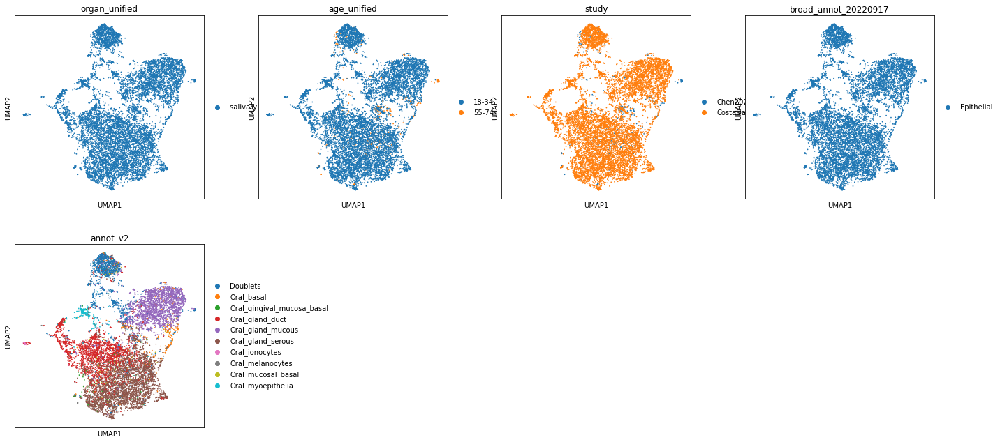

In [3]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata, color=['organ_unified', 'age_unified','study','broad_annot_20220917','annot_v2'])

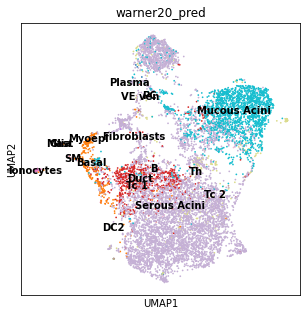

In [4]:
sc.pl.umap(adata, color=['warner20_pred'],legend_loc='on data')

In [5]:
adata.X.max()

39540.0

In [6]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

In [7]:
adata.X.max()

8.662238

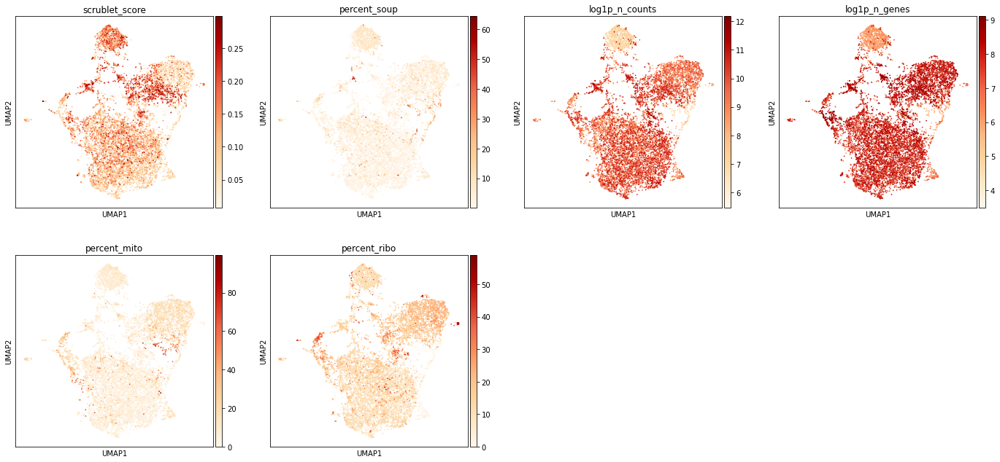

In [9]:
#plot some basic QC
sc.pl.umap(adata, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

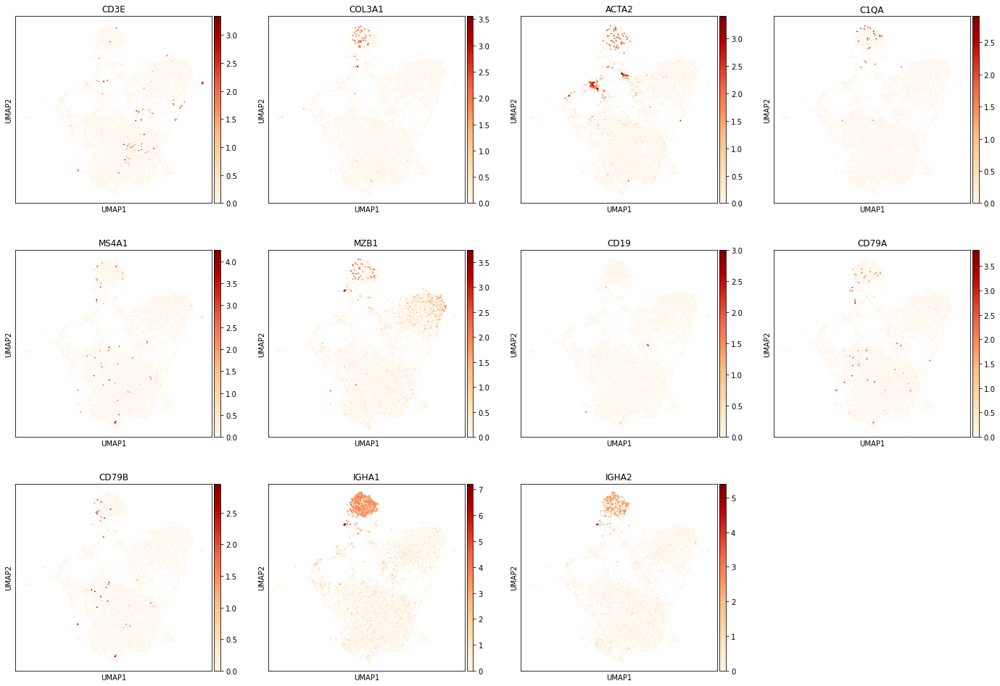

In [10]:
#plot doublet genes
sc.pl.umap(adata, color = ['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1','CD19','CD79A','CD79B','IGHA1','IGHA2'],cmap='OrRd')

In [8]:
#score cell cycle genes
cell_cycle_genes = ['MCM5',
'PCNA',
 'TYMS',
 'FEN1',
 'MCM2',
 'MCM4',
 'RRM1',
 'UNG',
 'GINS2',
 'MCM6',
 'CDCA7',
 'DTL',
 'PRIM1',
 'UHRF1',
 'MLF1IP',
 'HELLS',
 'RFC2',
 'RPA2',
 'NASP',
 'RAD51AP1',
 'GMNN',
 'WDR76',
 'SLBP',
 'CCNE2',
 'UBR7',
 'POLD3',
 'MSH2',
 'ATAD2',
 'RAD51',
 'RRM2',
 'CDC45',
 'CDC6',
 'EXO1',
 'TIPIN',
 'DSCC1',
 'BLM',
 'CASP8AP2',
 'USP1',
 'CLSPN',
 'POLA1',
 'CHAF1B',
 'BRIP1',
 'E2F8',
 'HMGB2',
 'CDK1',
 'NUSAP1',
 'UBE2C',
 'BIRC5',
 'TPX2',
 'TOP2A',
 'NDC80',
 'CKS2',
 'NUF2',
 'CKS1B',
 'MKI67',
 'TMPO',
 'CENPF',
 'TACC3',
 'FAM64A',
 'SMC4',
 'CCNB2',
 'CKAP2L',
 'CKAP2',
 'AURKB',
 'BUB1',
 'KIF11',
 'ANP32E',
 'TUBB4B',
 'GTSE1',
 'KIF20B',
 'HJURP',
 'CDCA3',
 'HN1',
 'CDC20',
 'TTK',
 'CDC25C',
 'KIF2C',
 'RANGAP1',
 'NCAPD2',
 'DLGAP5',
 'CDCA2',
 'CDCA8',
 'ECT2',
 'KIF23',
 'HMMR',
 'AURKA',
 'PSRC1',
 'ANLN',
 'LBR',
 'CKAP5',
 'CENPE',
 'CTCF',
 'NEK2',
 'G2E3',
 'GAS2L3',
 'CBX5',
 'CENPA']

In [9]:
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
adata = adata[adata.obs.G2M_score.sort_values(ascending=True).index].copy()

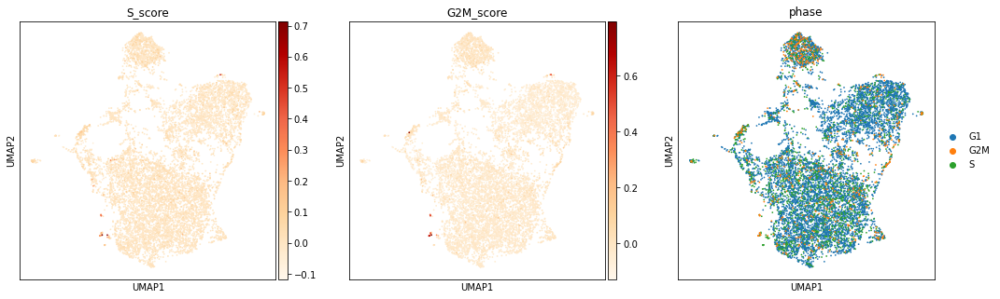

In [10]:
sc.pl.umap(adata,color=['S_score', 'G2M_score', 'phase'],cmap='OrRd')

In [31]:
sc.tl.leiden(adata, resolution = 0.5, neighbors_key="neighbors_scvi")

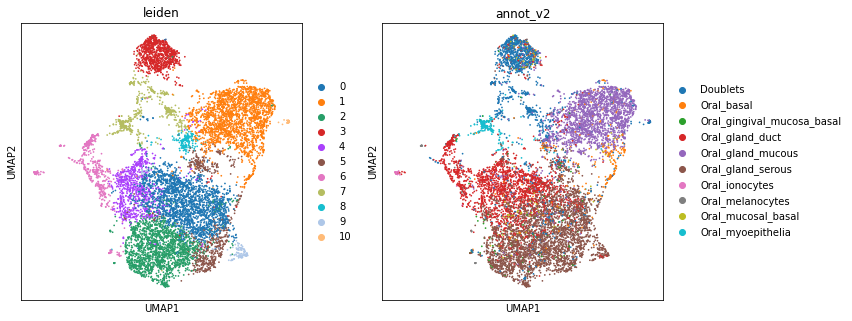

In [32]:
sc.pl.umap(adata,color=['leiden','annot_v2'])

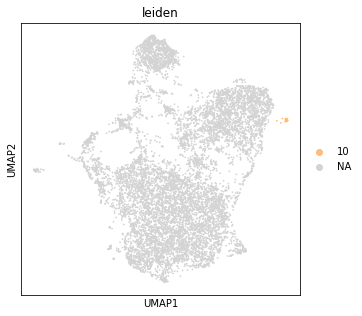

In [37]:
sc.pl.umap(adata,color=['leiden'],groups='10')

In [13]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import * 

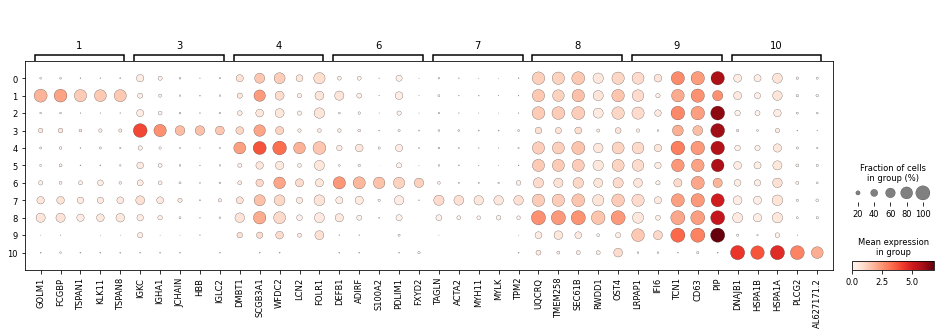

In [14]:
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='leiden', mks=mks)

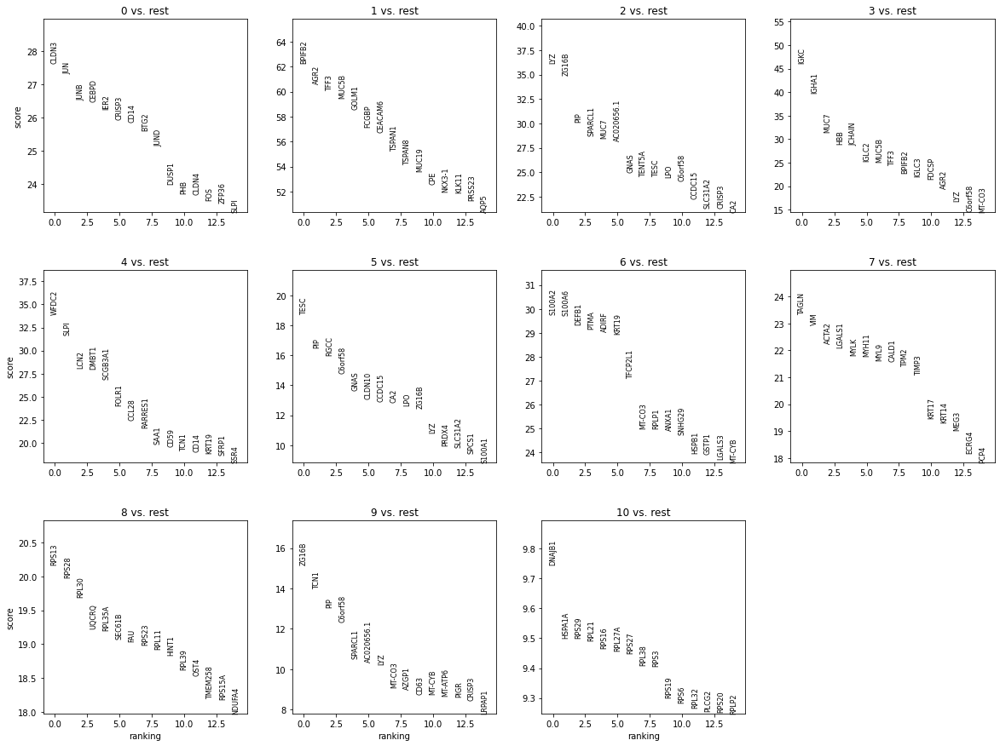

In [36]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

         Falling back to preprocessing with `sc.pp.pca` and default params.


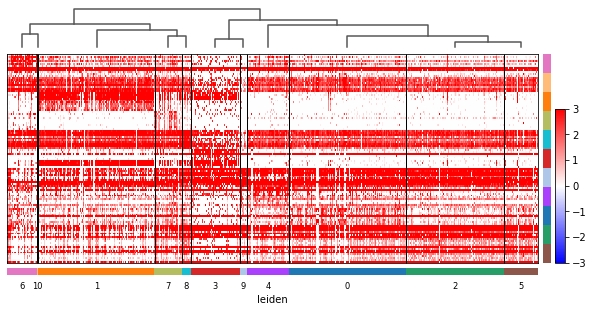

In [16]:
sc.tl.rank_genes_groups(adata,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(adata,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

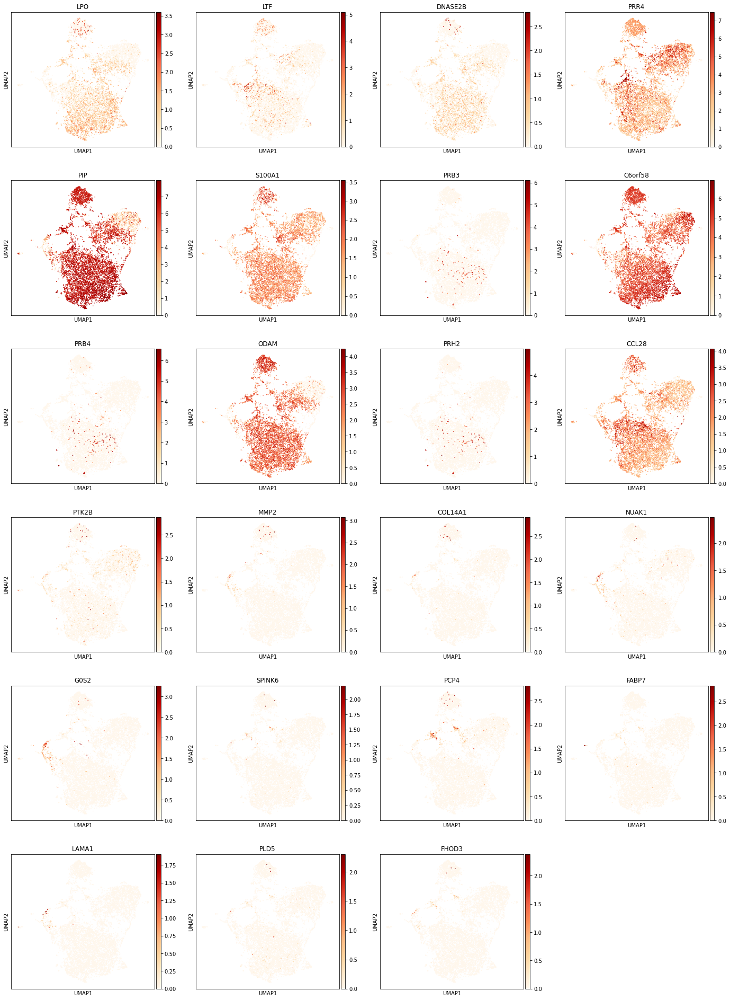

In [17]:
sc.pl.umap(adata, color=[
                         'LPO','LTF','DNASE2B','PRR4', 'PIP','S100A1', 'PRB3', 'C6orf58', 'PRB4', 'ODAM', 'PRH2','CCL28',#serous
                          'PTK2B', 'MMP2', 'COL14A1', 'NUAK1',"G0S2", #SMG basal
                         'SPINK6','PCP4','FABP7','LAMA1', 'PLD5',  'FHOD3', #myoepithelial
                         
                         
                         
                        ],color_map='OrRd',size=10)

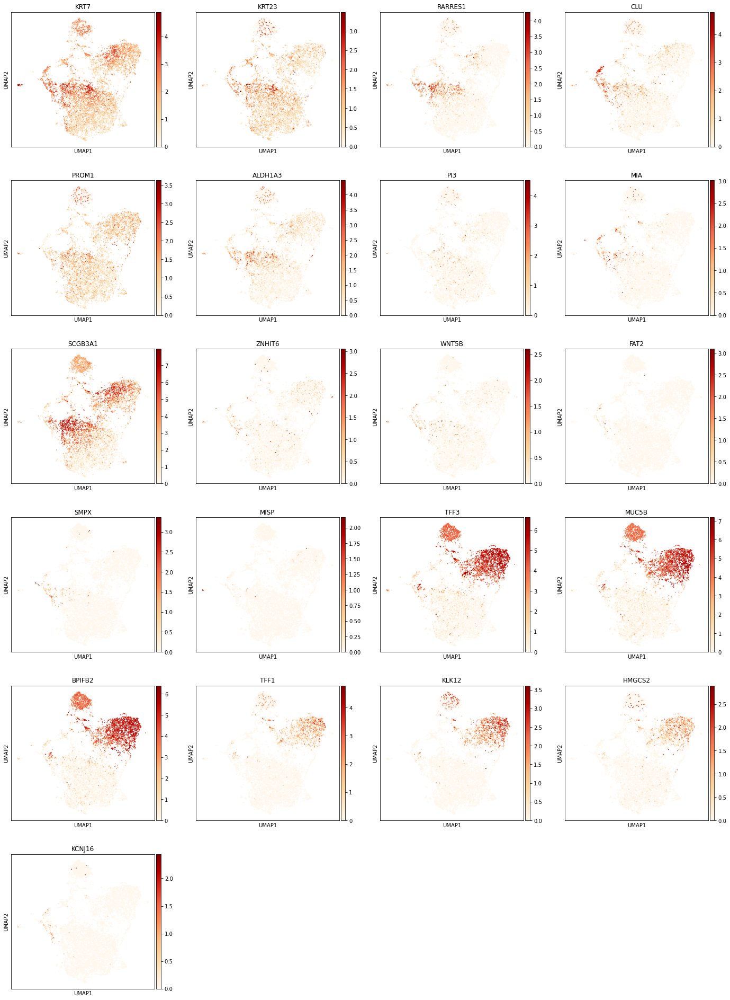

In [18]:
sc.pl.umap(adata, color=[
                         'KRT7','KRT23','RARRES1', 'CLU', 'PROM1','ALDH1A3', 'PI3', 'MIA','SCGB3A1', 'ZNHIT6','WNT5B','FAT2','SMPX','MISP',#duct cells
                         'TFF3','MUC5B', 'BPIFB2','TFF1','KLK12','HMGCS2','KCNJ16',#gland cells - mucous
                         
                         
                         
                        ],color_map='OrRd',size=10)

In [19]:
adata.obs.warner20_pred.value_counts()

Serous Acini    6416
Mucous Acini    2040
Duct             703
Basal            341
Th               335
Ionocytes         56
Tc 2              17
Fibroblasts       14
Tc 1              13
B                 12
Plasma             8
DC2                6
Mast               6
Myoepi             5
SM                 4
PC                 1
Glia               1
VE ven             1
Name: warner20_pred, dtype: int64

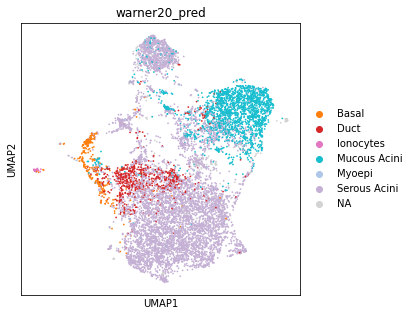

In [35]:
sc.pl.umap(adata,color='warner20_pred',groups=['Myoepi','Duct', 'Mucous Acini', 'Basal', 'Ionocytes','Serous Acini'])

In [24]:
pd.crosstab(adata.obs.warner20_pred,adata.obs.leiden)

leiden,0,1,2,3,4,5,6,7,8,9,10
warner20_pred,,,,,,,,,,,
B,3,0,5,2,0,0,0,2,0,0,0
Basal,14,0,7,0,12,0,303,5,0,0,0
DC2,0,0,4,0,2,0,0,0,0,0,0
Duct,235,30,9,3,338,1,58,14,0,15,0
Fibroblasts,1,0,0,0,0,0,7,6,0,0,0
Glia,0,0,0,0,0,0,1,0,0,0,0
Ionocytes,0,0,0,0,0,0,56,0,0,0,0
Mast,0,0,0,0,0,0,6,0,0,0,0
Mucous Acini,18,1721,8,76,5,36,31,110,34,0,1


In [26]:
pd.crosstab(adata.obs.annot_v2,adata.obs.leiden)

leiden,0,1,2,3,4,5,6,7,8,9,10
annot_v2,,,,,,,,,,,
Doublets,93,77,45,709,14,47,23,305,29,0,22
Oral_basal,42,158,23,18,0,19,3,2,21,0,1
Oral_gingival_mucosa_basal,25,3,34,3,8,9,12,4,0,0,0
Oral_gland_duct,728,28,186,53,632,32,402,8,5,37,0
Oral_gland_mucous,39,1887,15,39,21,41,4,11,85,0,9
Oral_gland_serous,1237,13,1509,50,97,476,19,5,19,98,0
Oral_ionocytes,0,0,0,0,0,0,60,0,0,0,0
Oral_melanocytes,4,3,11,0,0,0,20,1,0,0,0
Oral_mucosal_basal,24,13,25,40,10,3,0,0,0,0,0


In [38]:
new_cluster_names = [
    'Salivary_duct/serous','Salivary_mucous', #0,1
    'Salivary_serous','Doublets', #2,3
    'Salivary_duct','Salivary_serous', #4,5
    'Salivary_basal','Doublets', #6,7 - cluster 7 doublets have muscle markers, check if they could be myoepithelial cells
    'Doublets','Salivary_duct/serous', #8,9
    'Doublets' #10 - poor quality cells

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

adata.obs['annot_v3'] = [conv[x] for x in adata.obs['leiden']]

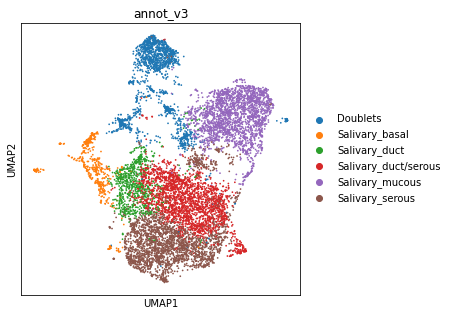

In [39]:
sc.pl.umap(adata,color='annot_v3')

In [40]:
DS = adata[adata.obs.annot_v3.isin(['Salivary_duct/serous','Salivary_duct','Salivary_serous'])].copy()

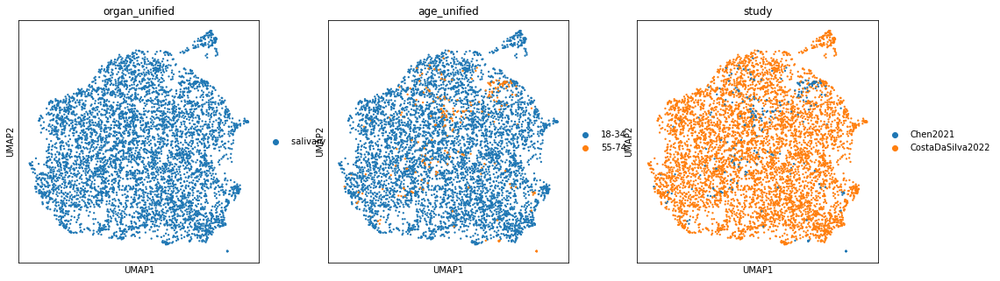

In [41]:
sc.pp.neighbors(
            DS,
            use_rep="X_scvi",
            n_pcs=DS.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(DS, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(DS, color=['organ_unified', 'age_unified','study'])

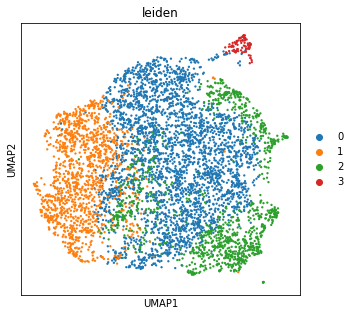

In [56]:
sc.tl.leiden(DS, resolution = 0.3, neighbors_key="neighbors_scvi")
sc.pl.umap(DS, color=['leiden'])

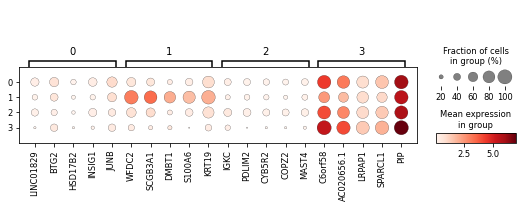

In [57]:
DS.raw = DS.copy()
mkst = calc_marker_stats(DS, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(DS, groupby='leiden', mks=mks)

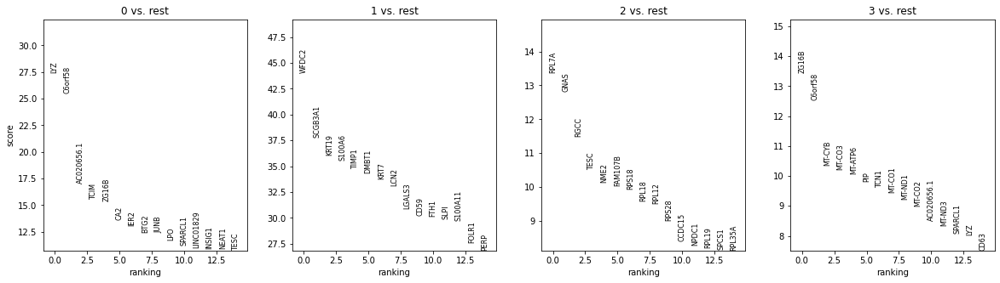

In [58]:
sc.tl.rank_genes_groups(DS, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(DS, n_genes=15, sharey=False)

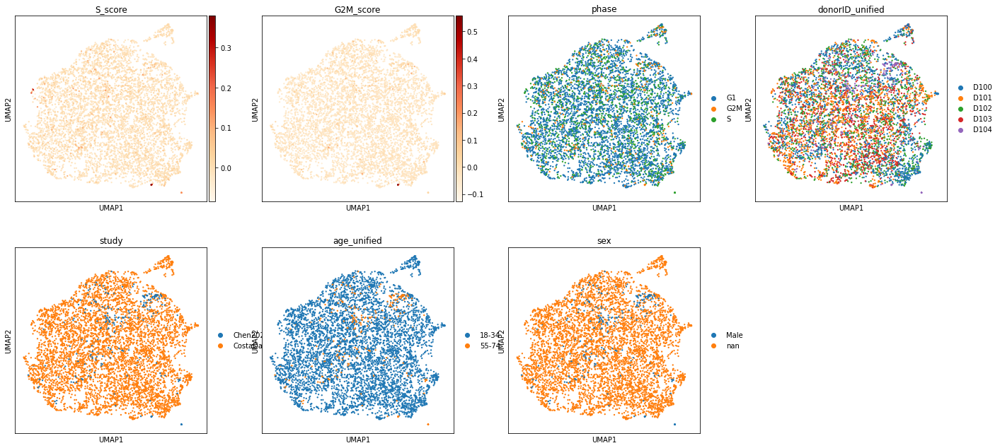

In [50]:
sc.pl.umap(DS,color=['S_score','G2M_score','phase','donorID_unified','study','age_unified','sex'],cmap='OrRd')

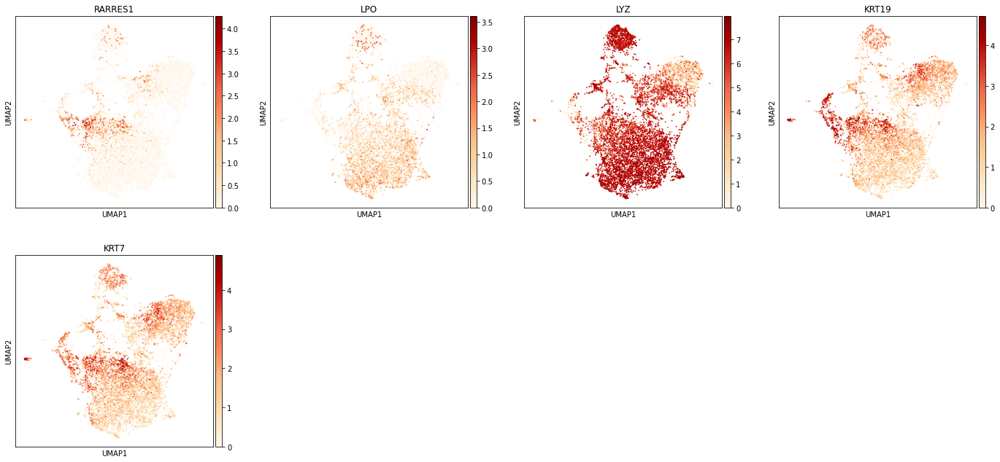

In [66]:
sc.pl.umap(adata,color=['RARRES1','LPO','LYZ','KRT19','KRT7'],cmap='OrRd')

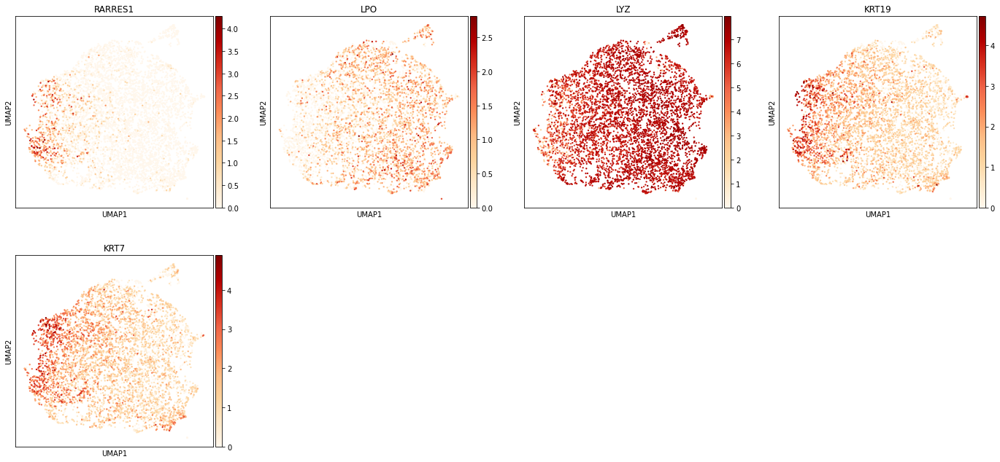

In [65]:
sc.pl.umap(DS,color=['RARRES1','LPO','LYZ','KRT19','KRT7'],cmap='OrRd')

In [67]:
new_cluster_names = [
    'Salivary_serous','Salivary_duct', #0,1
    'Salivary_serous','Salivary_serous'#2,3
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

DS.obs['annot_v3'] = [conv[x] for x in DS.obs['leiden']]

In [68]:
ON = {O:N for O,N in zip(DS.obs_names,DS.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

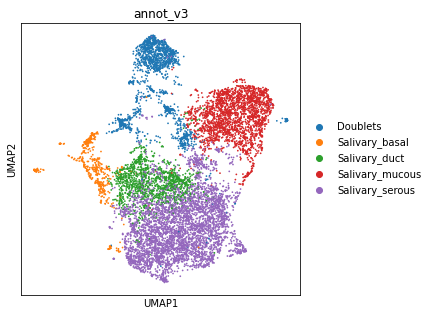

In [69]:
sc.pl.umap(adata,color='annot_v3')

In [70]:
basal = adata[adata.obs.annot_v3.isin(['Salivary_basal'])].copy()

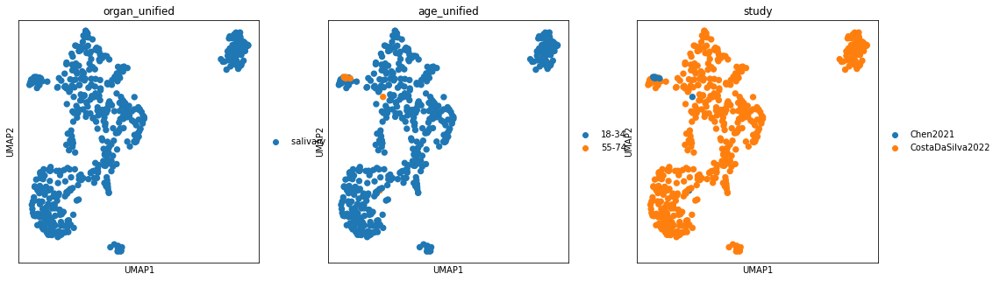

In [71]:
sc.pp.neighbors(
            basal,
            use_rep="X_scvi",
            n_pcs=basal.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(basal, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(basal, color=['organ_unified', 'age_unified','study'])

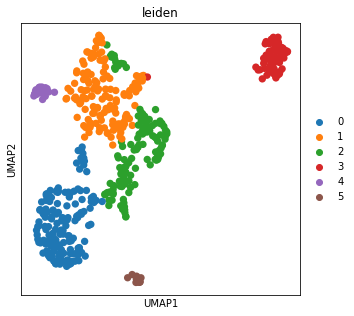

In [122]:
sc.tl.leiden(basal, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(basal, color=['leiden'])

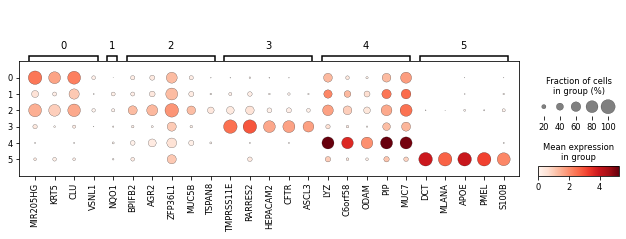

In [123]:
basal.raw = basal.copy()
mkst = calc_marker_stats(basal, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(basal, groupby='leiden', mks=mks)

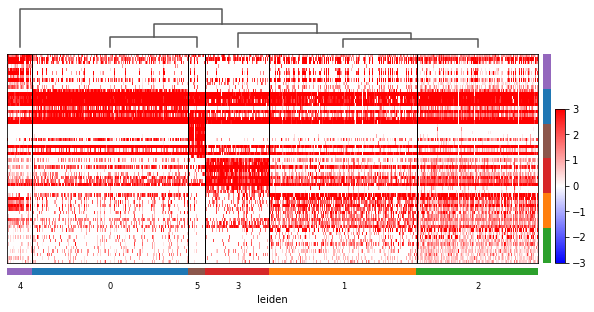

In [124]:
sc.tl.rank_genes_groups(basal,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(basal, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(basal,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

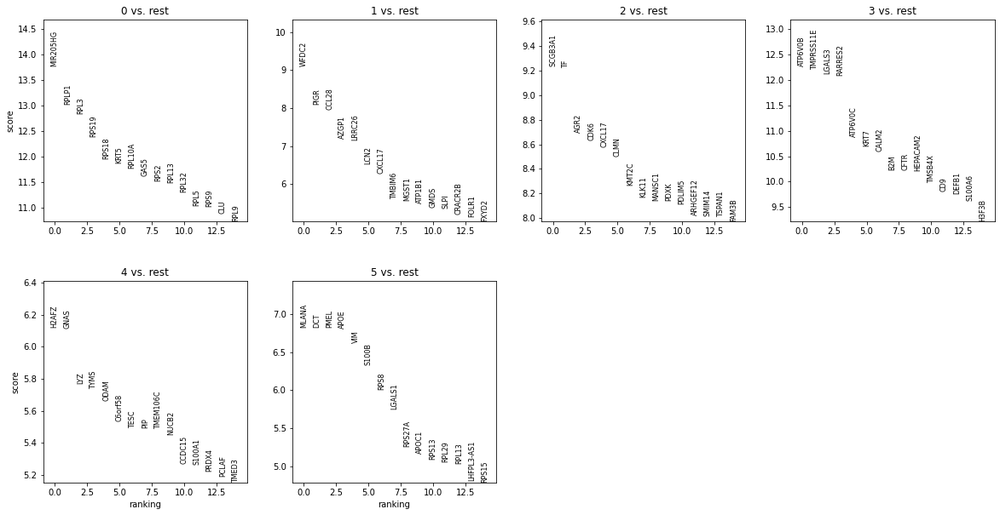

In [125]:
sc.tl.rank_genes_groups(basal, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(basal, n_genes=15, sharey=False)

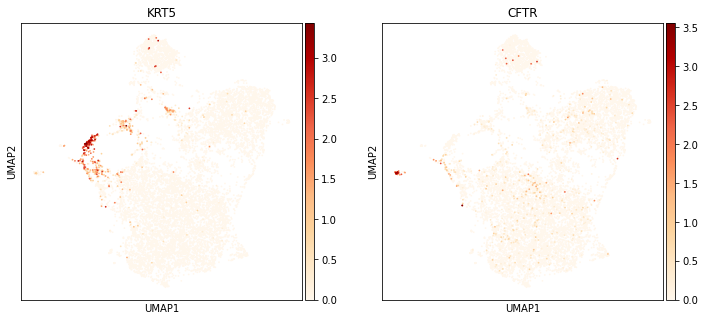

In [83]:
sc.pl.umap(adata,color=['KRT5','CFTR'],cmap='OrRd')

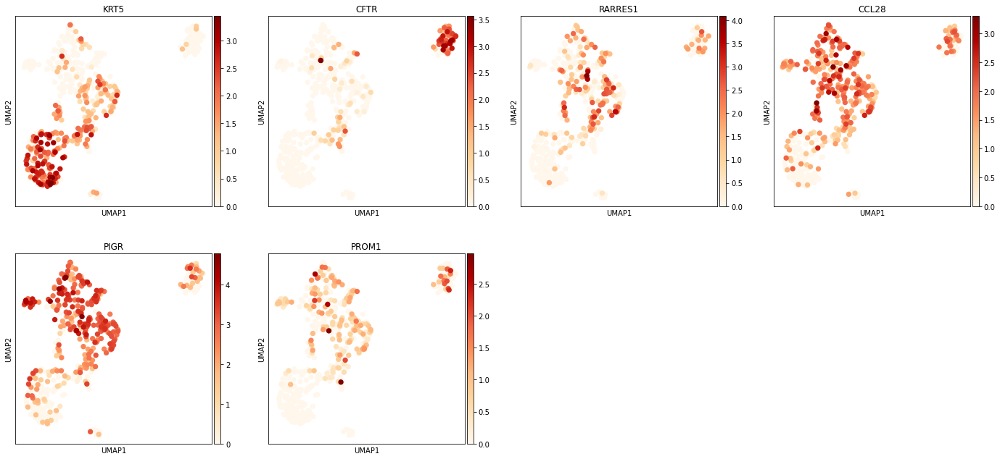

In [87]:
sc.pl.umap(basal,color=['KRT5','CFTR','RARRES1','CCL28','PIGR','PROM1'],cmap='OrRd')

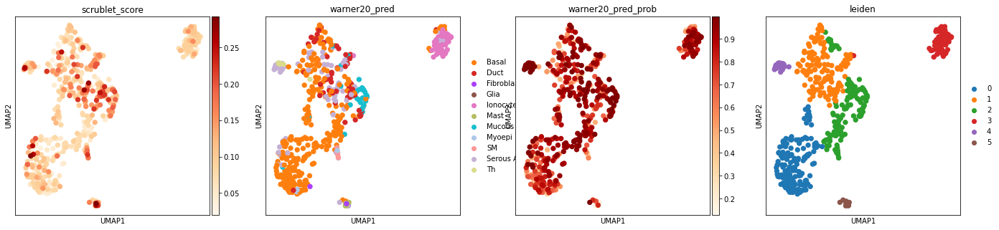

In [128]:
sc.pl.umap(basal,color=['scrublet_score','warner20_pred','warner20_pred_prob','leiden'],cmap='OrRd')

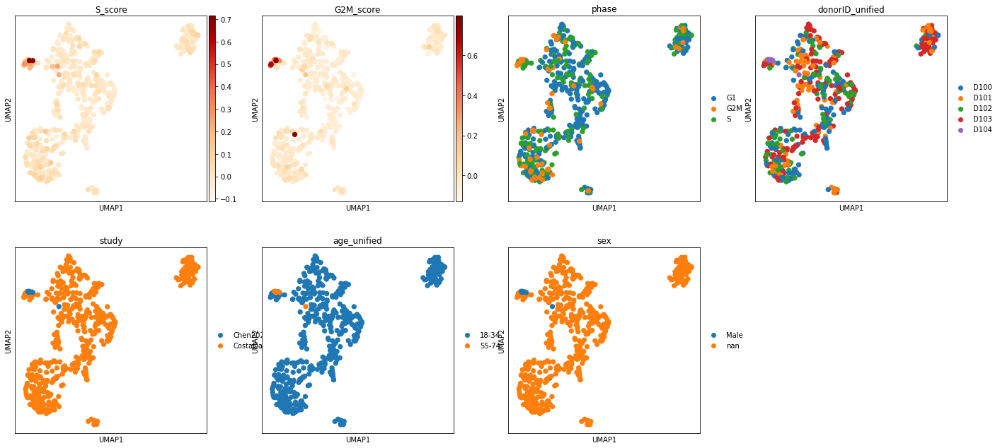

In [130]:
sc.pl.umap(basal,color=['S_score','G2M_score','phase','donorID_unified','study','age_unified','sex'],cmap='OrRd')

In [129]:
pd.crosstab(basal.obs.warner20_pred,basal.obs.leiden)

leiden,0,1,2,3,4,5
warner20_pred,,,,,,
Basal,147,80,64,8,1,3
Duct,1,34,22,1,0,0
Fibroblasts,1,0,0,0,0,6
Glia,0,0,0,0,0,1
Ionocytes,0,1,0,55,0,0
Mast,0,0,0,0,0,6
Mucous Acini,2,3,26,0,0,0
Myoepi,3,0,1,0,0,0
SM,0,0,4,0,0,0


In [131]:
new_cluster_names = [
    'Salivary_basal','Doublets', #0,1
    'Doublets','Salivary_ionocytes',#2,3
    'Salivary_cycling','Salivary_melanocytes'#4,5 - 4 is cycling serous cells?
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

basal.obs['annot_v3'] = [conv[x] for x in basal.obs['leiden']]

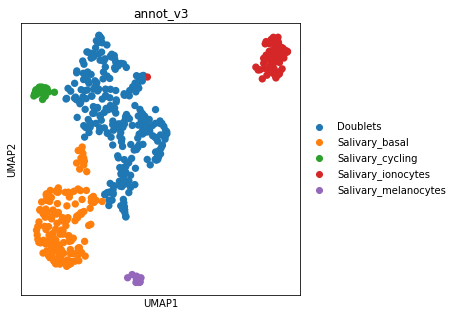

In [132]:
sc.pl.umap(basal,color='annot_v3')

In [133]:
ON = {O:N for O,N in zip(basal.obs_names,basal.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

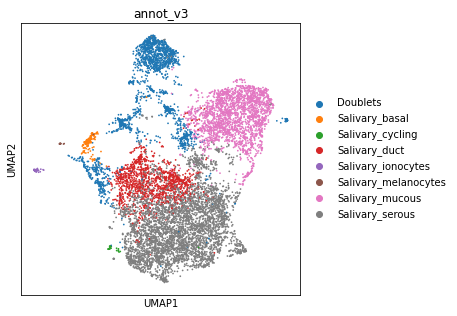

In [134]:
sc.pl.umap(adata,color='annot_v3')

In [104]:
doublets = adata[adata.obs.annot_v3.isin(['Doublets'])].copy()

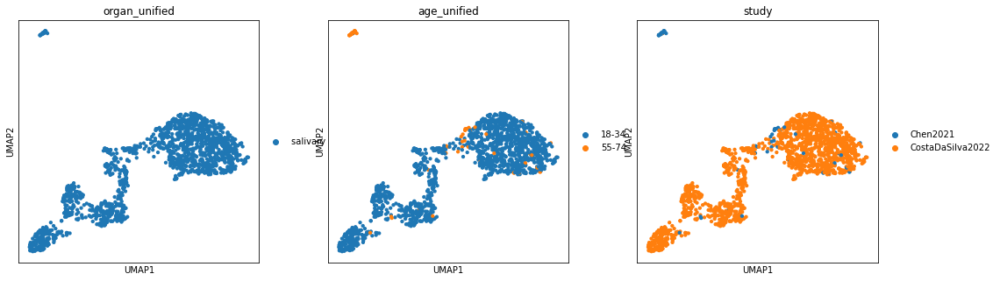

In [105]:
sc.pp.neighbors(
            doublets,
            use_rep="X_scvi",
            n_pcs=doublets.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(doublets, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(doublets, color=['organ_unified', 'age_unified','study'])

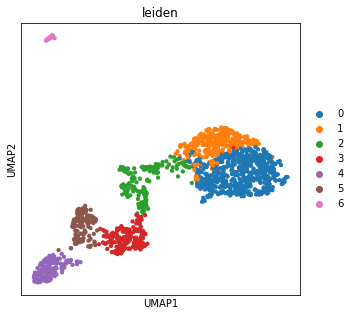

In [135]:
sc.tl.leiden(doublets, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(doublets, color=['leiden'])

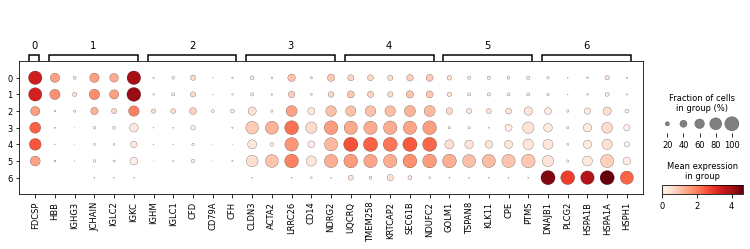

In [136]:
doublets.raw = doublets.copy()
mkst = calc_marker_stats(doublets, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(doublets, groupby='leiden', mks=mks)

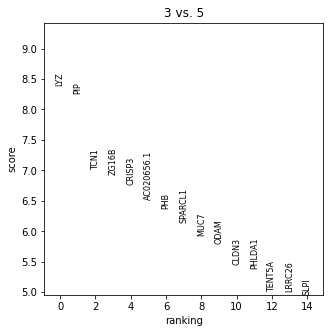

In [155]:
sc.tl.rank_genes_groups(doublets, 'leiden', method='wilcoxon',groups=['3'], reference='5')
sc.pl.rank_genes_groups(doublets, n_genes=15, sharey=False,groups=['3'])

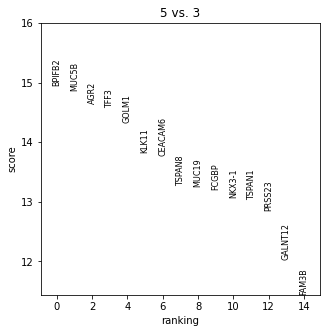

In [156]:
sc.tl.rank_genes_groups(doublets, 'leiden', method='wilcoxon',groups=['5'], reference='3')
sc.pl.rank_genes_groups(doublets, n_genes=15, sharey=False,groups=['5'])

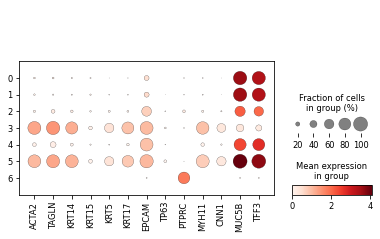

In [158]:
sc.pl.dotplot(doublets,var_names=['ACTA2','TAGLN','KRT14','KRT15','KRT5','KRT17','EPCAM','TP63','PTPRC','MYH11','CNN1','MUC5B','TFF3'],groupby='leiden')

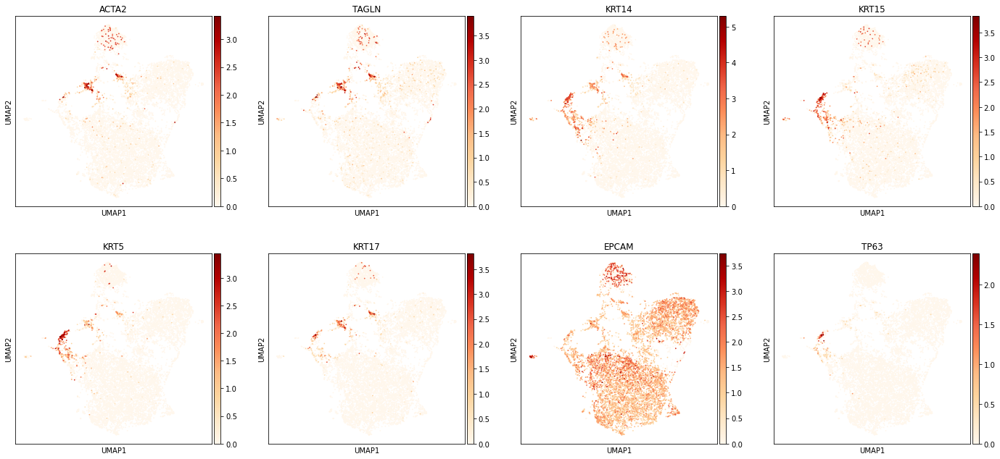

In [112]:
sc.pl.umap(adata,color=['ACTA2','TAGLN','KRT14','KRT15','KRT5','KRT17','EPCAM','TP63'],cmap='OrRd')

In [113]:
adata

AnnData object with n_obs × n_vars = 9979 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

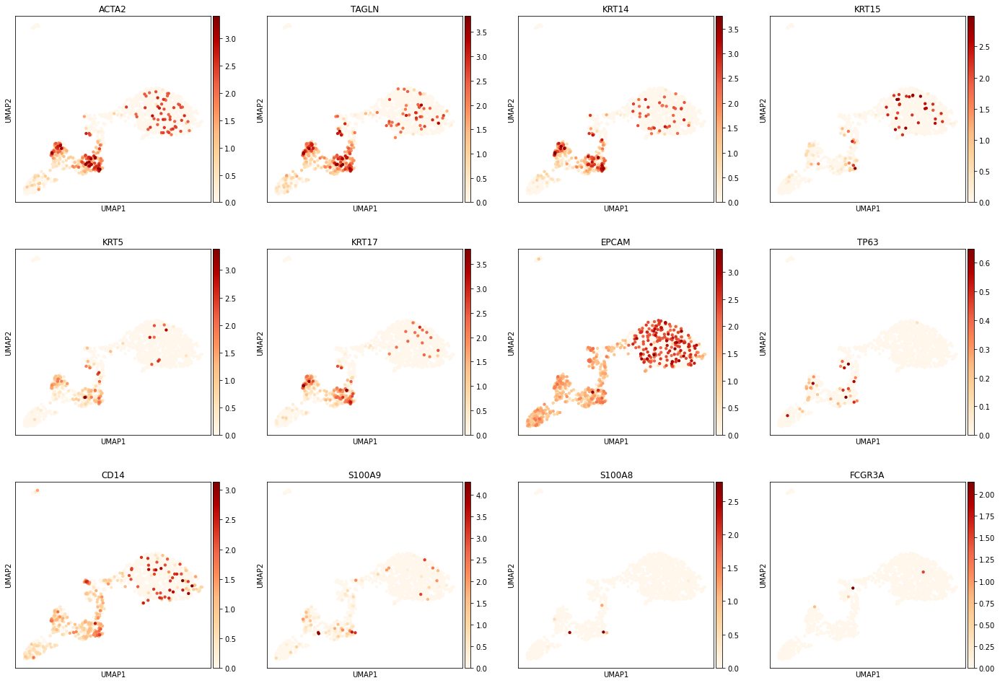

In [154]:
sc.pl.umap(doublets,color=['ACTA2','TAGLN','KRT14','KRT15','KRT5','KRT17','EPCAM','TP63','CD14','S100A9','S100A8','FCGR3A'],cmap='OrRd')

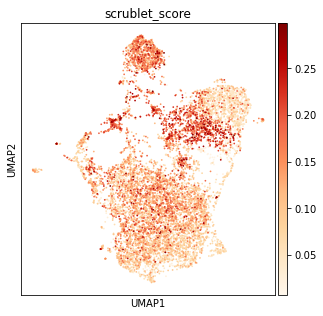

In [117]:
sc.pl.umap(adata,color=['scrublet_score'],cmap='OrRd')

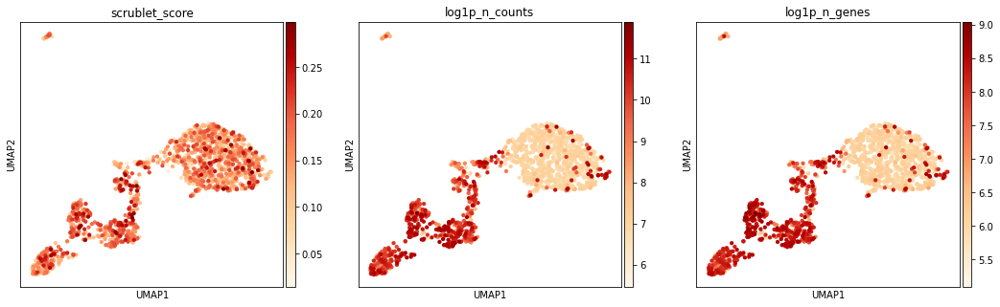

In [146]:
sc.pl.umap(doublets,color=['scrublet_score','log1p_n_counts','log1p_n_genes'],cmap='OrRd')

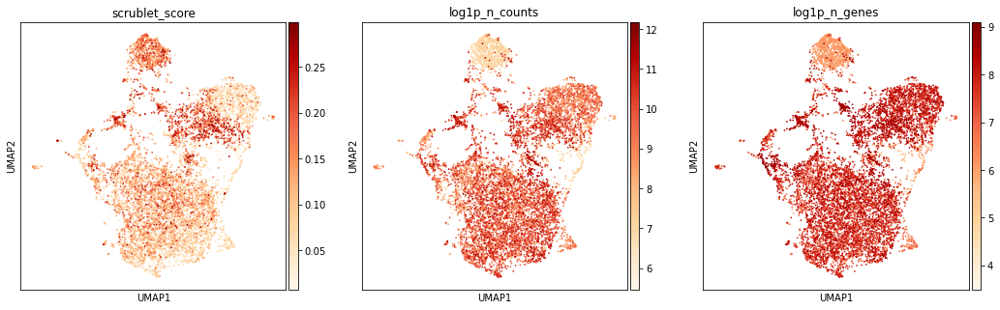

In [149]:
sc.pl.umap(adata,color=['scrublet_score','log1p_n_counts','log1p_n_genes'],cmap='OrRd')

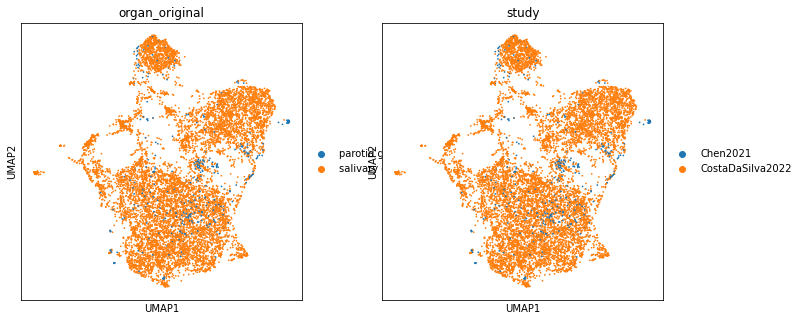

In [148]:
sc.pl.umap(adata,color=['organ_original','study'])

Conclusion: all are doublets except cluster 3 which is bonafide myoepithelial cells, and cluster 5 are doublets of myoepithelial cells/muscle cells and mucous cells (MUC5B, TFF3+)

In [161]:
new_cluster_names = [
    'Doublets','Doublets', #0,1
    'Doublets','Salivary_myoepithelial',#2,3
    'Doublets','Doublets',#4,5
    'Doublets' #6
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

doublets.obs['annot_v3'] = [conv[x] for x in doublets.obs['leiden']]

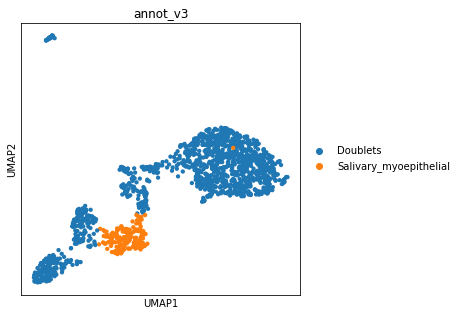

In [162]:
sc.pl.umap(doublets,color='annot_v3')

In [163]:
ON = {O:N for O,N in zip(doublets.obs_names,doublets.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

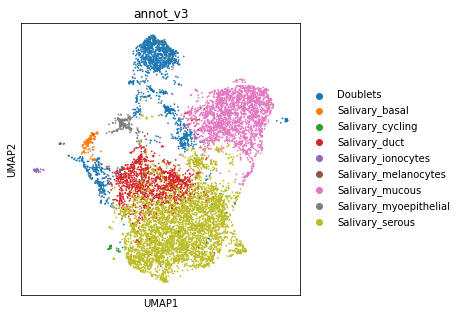

In [164]:
sc.pl.umap(adata,color='annot_v3')

In [185]:
serous = adata[adata.obs.annot_v3.isin(['Salivary_serous','Salivary_cycling'])].copy()

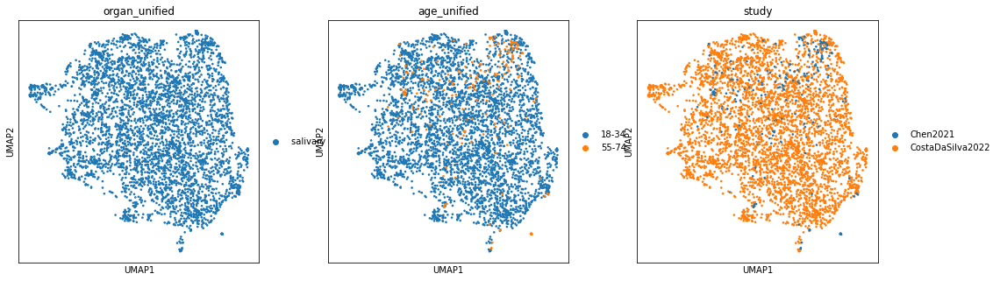

In [186]:
sc.pp.neighbors(
            serous,
            use_rep="X_scvi",
            n_pcs=doublets.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(serous, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(serous, color=['organ_unified', 'age_unified','study'])

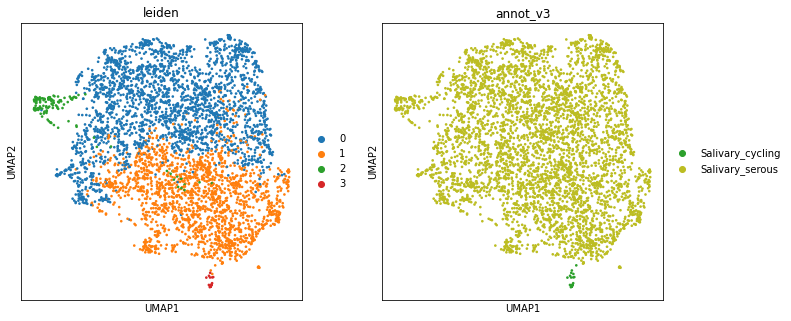

In [187]:
sc.tl.leiden(serous, resolution = 0.3, neighbors_key="neighbors_scvi")
sc.pl.umap(serous, color=['leiden','annot_v3'])

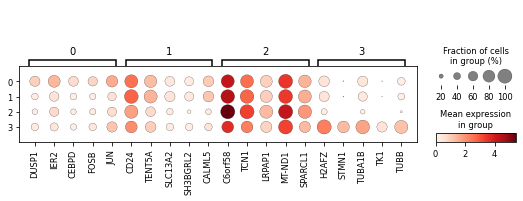

In [188]:
serous.raw = serous.copy()
mkst = calc_marker_stats(serous, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(serous, groupby='leiden', mks=mks)

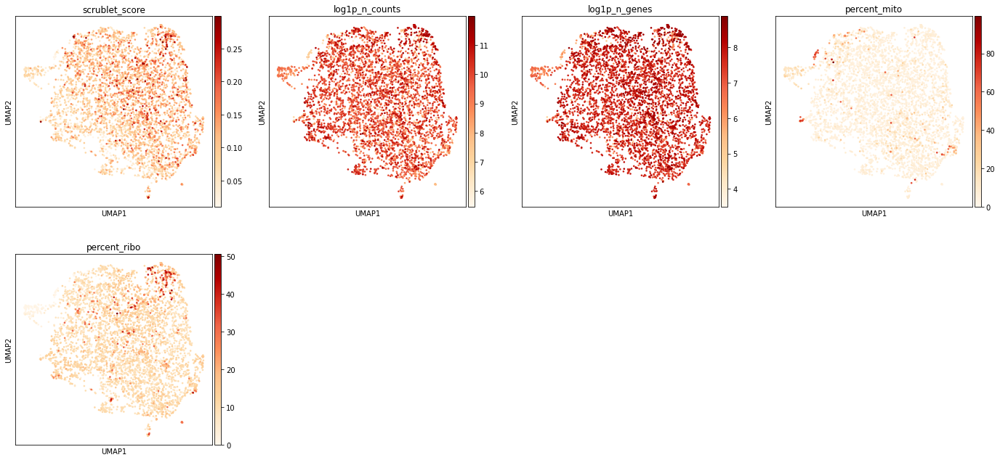

In [190]:
sc.pl.umap(serous,color=['scrublet_score','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

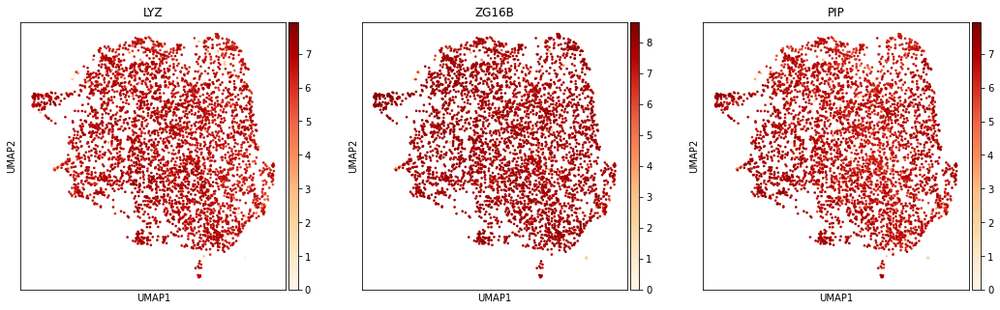

In [202]:
sc.pl.umap(serous,color=['LYZ','ZG16B','PIP'],cmap='OrRd')

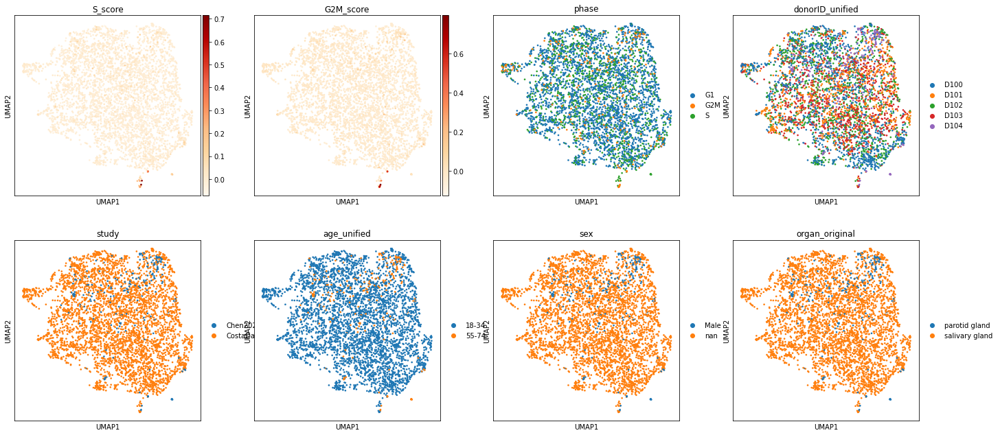

In [176]:
sc.pl.umap(serous,color=['S_score','G2M_score','phase','donorID_unified','study','age_unified','sex','organ_original'],cmap='OrRd')

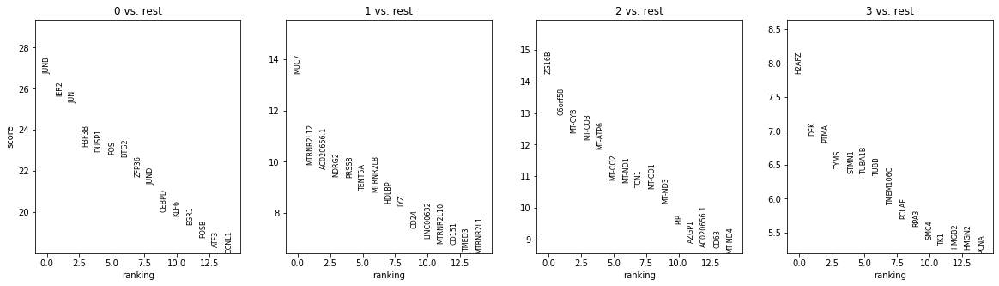

In [177]:
sc.tl.rank_genes_groups(serous, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(serous, n_genes=15, sharey=False)

In [191]:
mucous = adata[adata.obs.annot_v3.isin(['Salivary_mucous'])].copy()

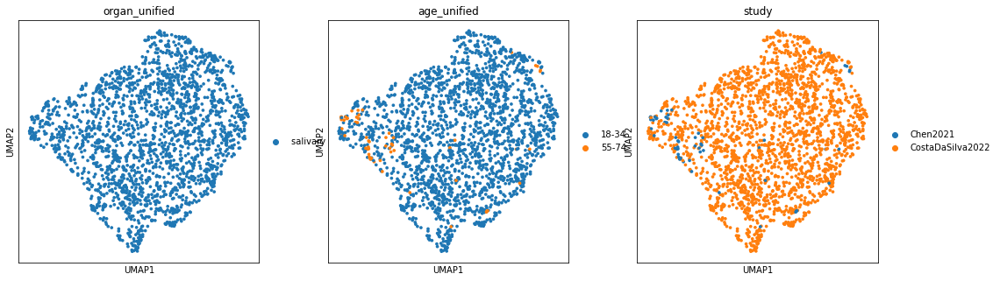

In [192]:
sc.pp.neighbors(
            mucous,
            use_rep="X_scvi",
            n_pcs=mucous.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(mucous, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(mucous, color=['organ_unified', 'age_unified','study'])

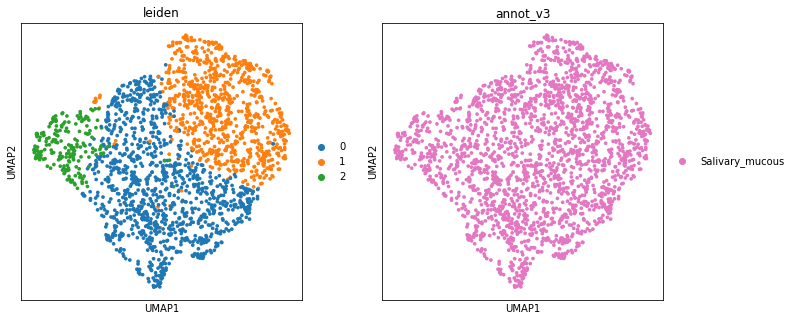

In [197]:
sc.tl.leiden(mucous, resolution = 0.3, neighbors_key="neighbors_scvi")
sc.pl.umap(mucous, color=['leiden','annot_v3'])

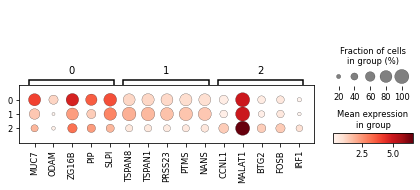

In [204]:
mucous.raw = mucous.copy()
mkst = calc_marker_stats(mucous, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(mucous, groupby='leiden', mks=mks)

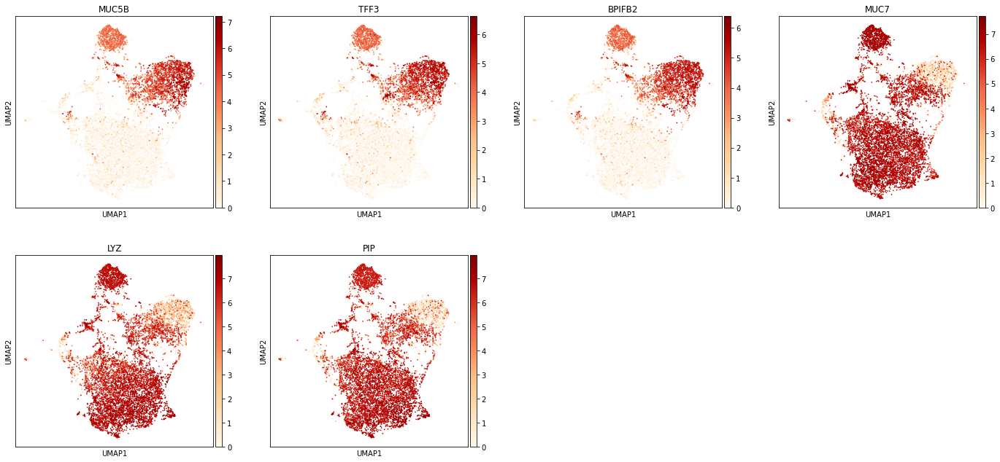

In [198]:
sc.pl.umap(adata,color=['MUC5B', 'TFF3', 'BPIFB2','MUC7', 'LYZ','PIP'],cmap='OrRd')

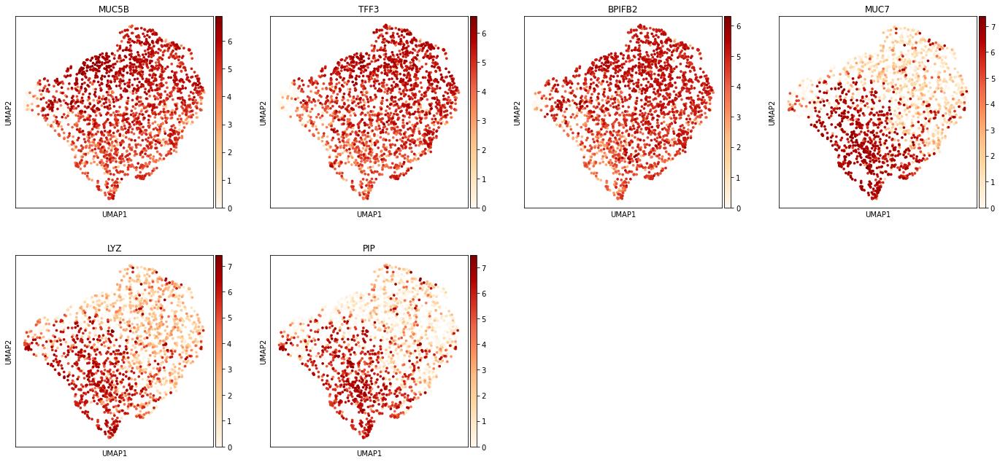

In [199]:
sc.pl.umap(mucous,color=['MUC5B', 'TFF3', 'BPIFB2','MUC7', 'LYZ','PIP'],cmap='OrRd')

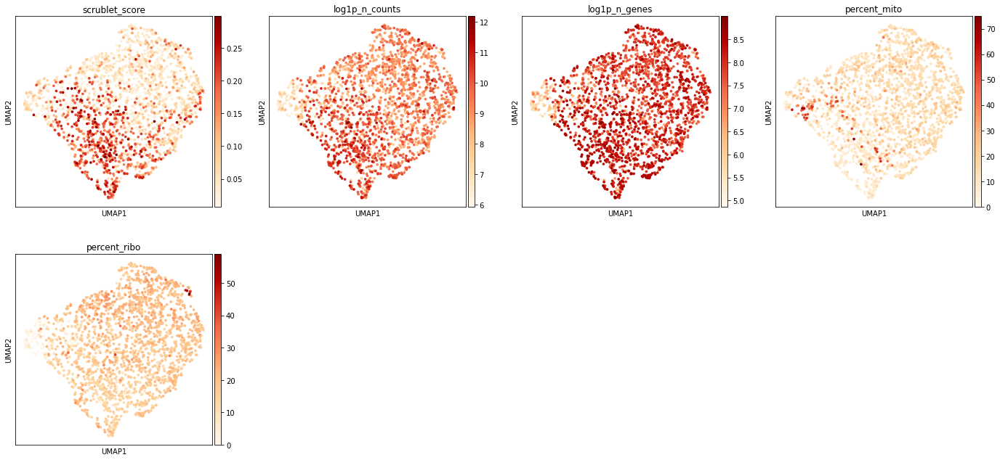

In [205]:
sc.pl.umap(mucous,color=['scrublet_score','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

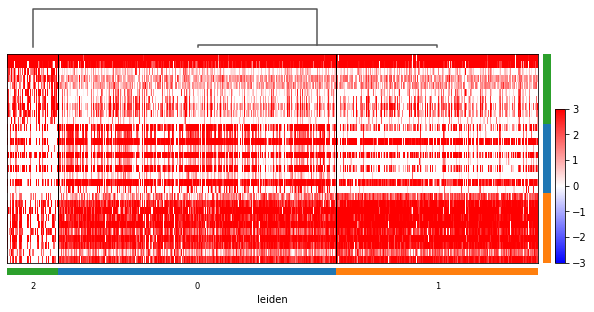

In [206]:
sc.tl.rank_genes_groups(mucous,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(mucous, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(mucous,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

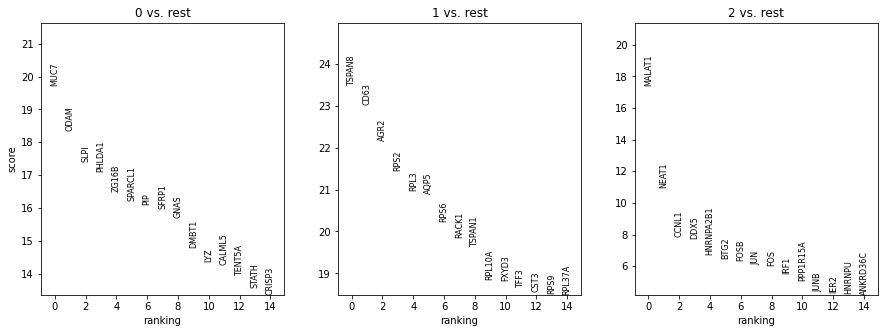

In [207]:
sc.tl.rank_genes_groups(mucous, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(mucous, n_genes=15, sharey=False)

In [208]:
new_cluster_names = [
    'Savliary_seromucous','Salivary_mucous', #0,1
    'Savliary_seromucous'#2
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

mucous.obs['annot_v3'] = [conv[x] for x in mucous.obs['leiden']]

In [209]:
ON = {O:N for O,N in zip(mucous.obs_names,mucous.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

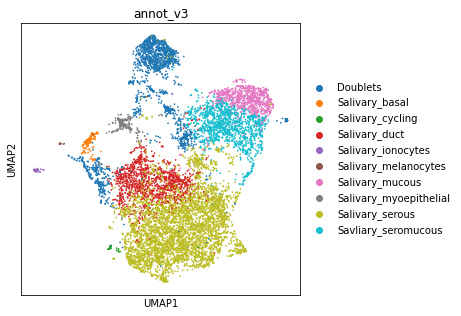

In [210]:
sc.pl.umap(adata,color='annot_v3')

In [211]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Salivary_epi.hvg5000_noRPL.scvi_output.annotv3.22021128.h5ad')

In [212]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [213]:
annot

,annot_v2,annot_v3
index,,
ACGATGTTCGTTGTGA-GSM5464616,Oral_gland_duct,Doublets
CGAGGAATCACAAGGG-GSM5464616,Oral_gland_duct,Salivary_serous
TATCGCCGTGACATCT-GSM5464618,Oral_gland_mucous,Salivary_duct
TCATATCAGGACTAAT-GSM5464618,Oral_gland_mucous,Savliary_seromucous
TACTGCCCAGGCACTC-GSM5464618,Oral_gland_mucous,Salivary_mucous
...,...,...
AGCTCAACAGACATCT-GSM5464618,Oral_gingival_mucosa_basal,Salivary_cycling
GAAGTAACACTTTATC-GSM5464615,Oral_gland_duct,Salivary_cycling
CTCCAACCAGCCATTA-GSM5464618,Oral_gland_serous,Salivary_cycling


In [214]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/Salivary_epi_annot_v3.csv')

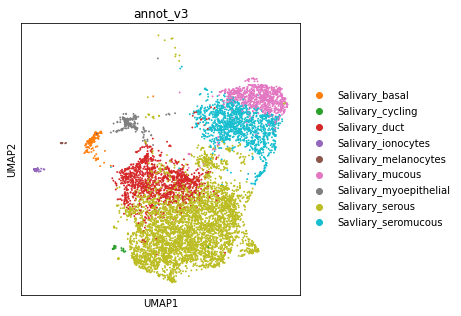

In [216]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [217]:
adata_nodoublets.X.max()

8.662238

In [218]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [219]:
adata_nodoublets.X.max()

39540.0

In [220]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/Salivary_epi.raw.annotv3.nodoublets.22021128.h5ad')

In [2]:
adata=sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Salivary_epi.hvg5000_noRPL.scvi_output.annotv3.22021128.h5ad')

In [10]:
adata.obs['annot_v3'] = (
    adata.obs["annot_v3"]
    .map(lambda x: {'Savliary_seromucous':'Salivary_seromucous',
                    'Salivary_melanocytes':'Salivary_melanocyte'
    }.get(x, x))
    .astype("category")
)

In [11]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Salivary_epi.hvg5000_noRPL.scvi_output.annotv3.22021128.h5ad')

In [12]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [13]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/Salivary_epi_annot_v3.csv')

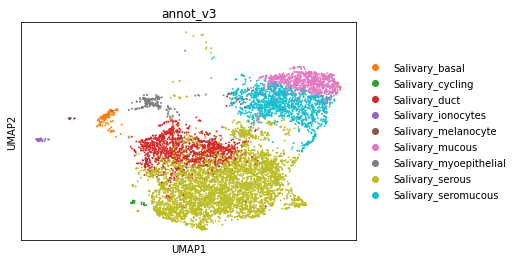

In [14]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [15]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [16]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/Salivary_epi.raw.annotv3.nodoublets.22021128.h5ad')

## Plots for figures

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/no_doublets/Salivary_epi.hvg5000_noRPL.scvi_output.annotv3.nodoublets.22021208.h5ad')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


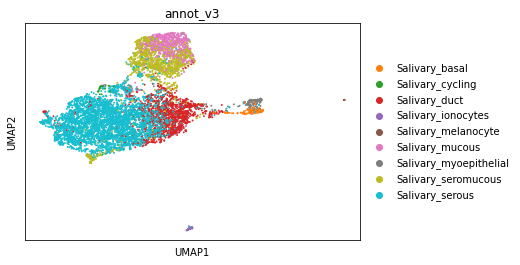

In [3]:
sc.pl.umap(adata,color='annot_v3')

In [4]:
adata.obs['fine_annot'] = adata.obs["annot_v3"].str.replace("Salivary_","")

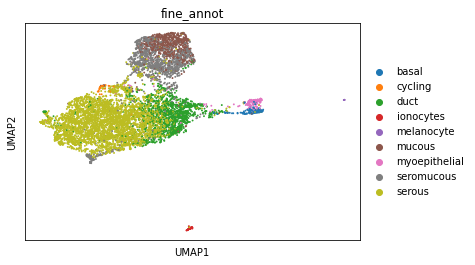

In [5]:
sc.pl.umap(adata,color='fine_annot')

In [6]:
list(adata.obs.fine_annot.unique())

['serous',
 'duct',
 'seromucous',
 'mucous',
 'basal',
 'ionocytes',
 'melanocyte',
 'myoepithelial',
 'cycling']

In [7]:
adata.obs['fine_annot'] = (
    adata.obs["fine_annot"]
    .map(lambda x: {'serous':'Serous',
 'duct':'Duct',
 'seromucous':'Seromucous',
 'mucous':'Mucous',
 'basal':'Basal',
 'ionocytes':'Ionocytes',
 'melanocyte':'Melanocyte',
 'myoepithelial':'Myoepithelial',
 'cycling':'Cycling'
        
        
         }.get(x, x))
    .astype("category")
)

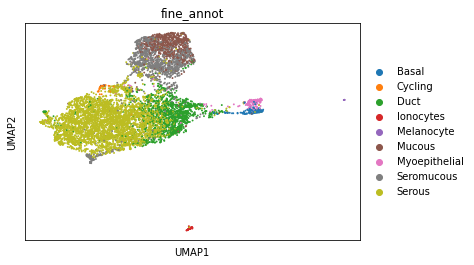

In [8]:
sc.pl.umap(adata,color='fine_annot')

In [9]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

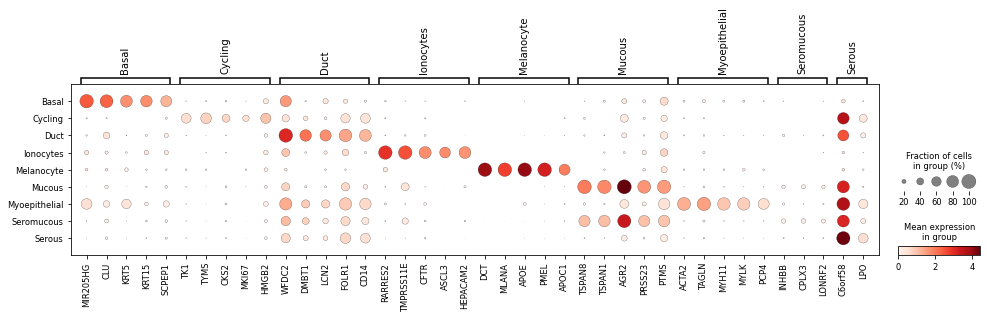

In [10]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="fine_annot")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='fine_annot', mks=mks)

In [11]:
marker_genes_dict = {'Basal':['KRT5','KRT15','CLU','SCPEP1'],
                     'Cycling':['MKI67','TK1','CKS2'],
                     'Duct':['RARRES1','ALDH1A3','CCL28'],
                     'Ionocytes':['RARRES2','CFTR','ASCL3','FOXI1'],
                     'Melanocyte':['PMEL','MLANA'],
                     'Mucous':['TFF3','MUC5B','BPIFB2'],
                     'Myoepithelial':['ACTA2','TAGLN','MYH11'],
                     'Serous':['LPO'],
    
    
}

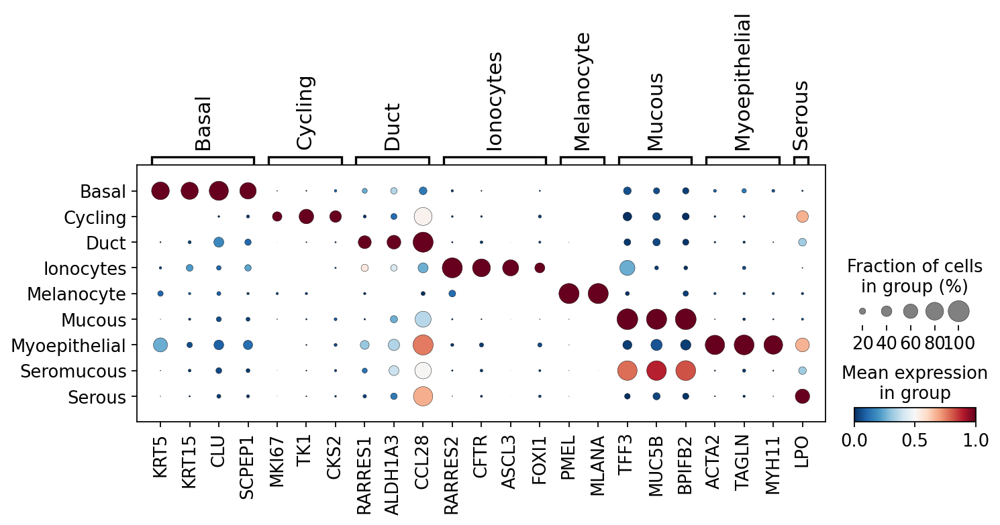

In [12]:
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_salivary_markers.png',color_map='RdBu_r', standard_scale='var')

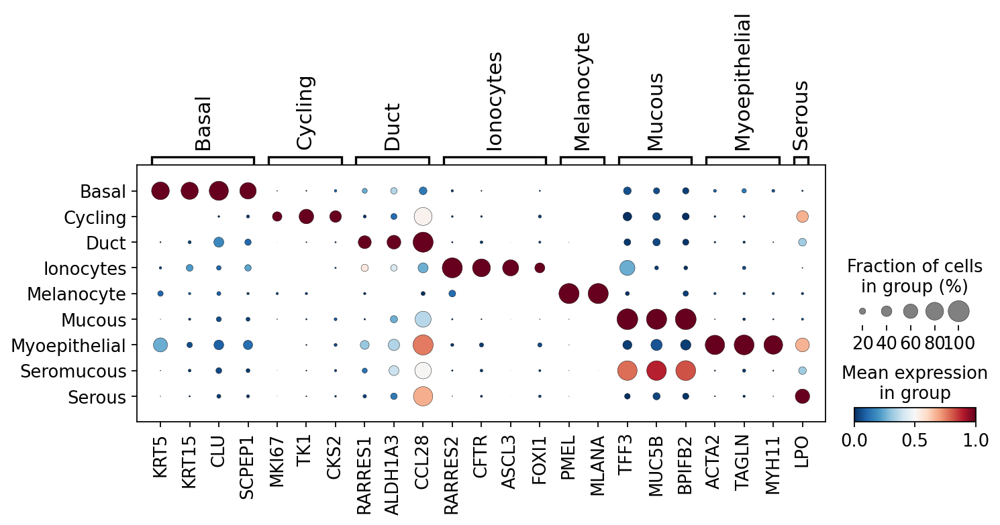

In [13]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_salivary_markers.pdf',color_map='RdBu_r', standard_scale='var')

In [14]:
#make some plots for paper figures

In [15]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.figsize'] = [5,5]
sc.set_figure_params(dpi=300,dpi_save=600)

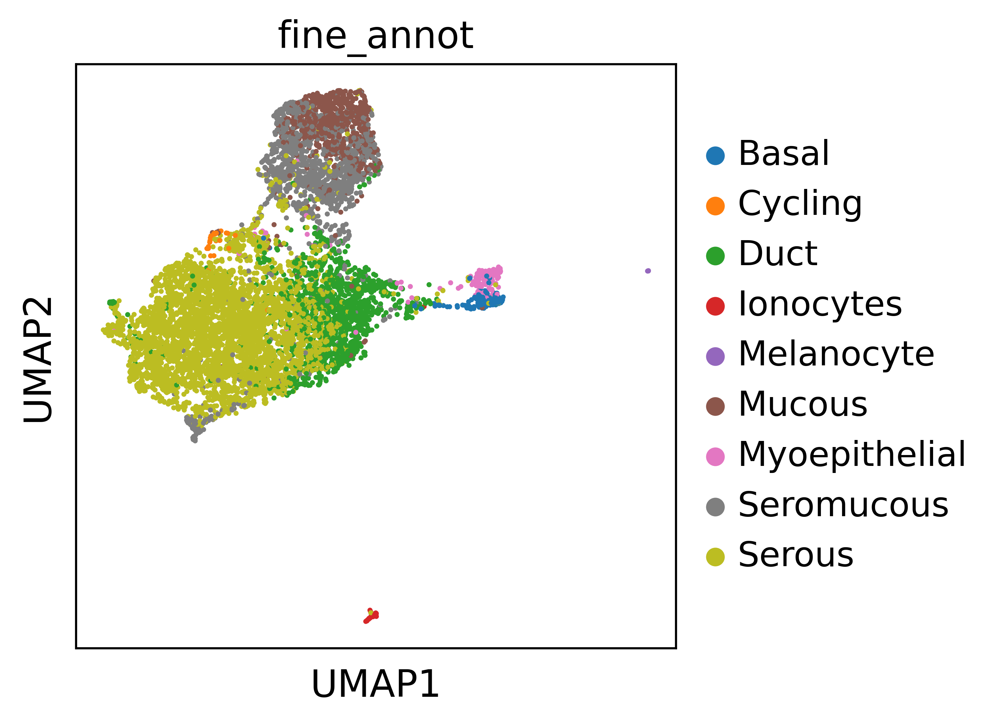

In [16]:
sc.pl.umap(adata,color='fine_annot',save='salivary_epi_annot.png')

<AxesSubplot: title={'center': 'fine_annot'}, xlabel='UMAP1', ylabel='UMAP2'>

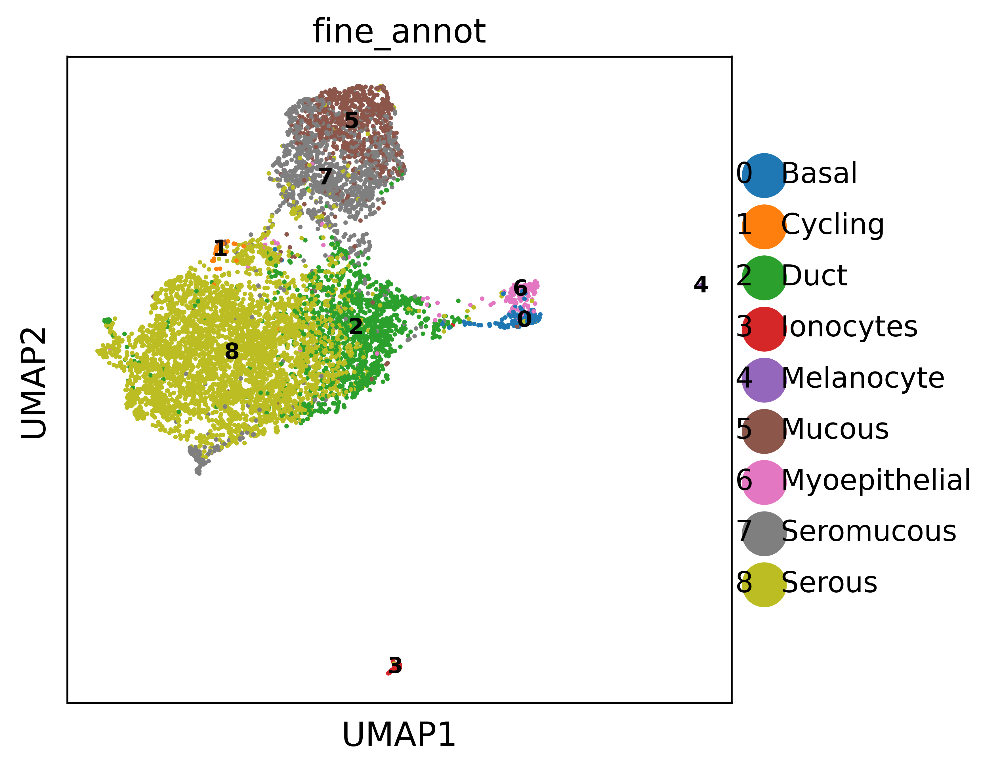

In [17]:
import sctk as sk
sk.plot_embedding(
    adata,
    basis="umap",
    groupby="fine_annot",
    figsize=(5, 5),
    save='figures/salivary_epi_annot.png')